In [1]:
# Import nilearn and numpy
from nilearn import datasets
from nilearn import surface
from nilearn import plotting
from nilearn import image
from nilearn import masking
import numpy as np
import pandas as pd
import glob
from nilearn import signal
from scipy import stats
import nibabel as nib
import glob
import os
sk = 3
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# install nsdcode by cloning the repository and following the instructions:
# https://github.com/cvnlab/nsdcode/
from nsdcode.nsd_mapdata import NSDmapdata
from nsdcode.nsd_datalocation import nsd_datalocation
from nsdcode.nsd_output import nsd_write_fs
from nsdcode.utils import makeimagestack

In [3]:
# List all paths
import platform
if platform.system() == "Darwin":
    basepath = '/Users/mayayablonski/Sherlock/groupScratch/'
elif platform.system() == "Linux":
    basepath = '/scratch/groups/jyeatman/'
    
basedir = basepath + 'NSD/ppdata/'
fsdir = basepath + 'NSD/nsddata/freesurfer/'
analysisdir = os.path.dirname(os.path.dirname((basedir))) + '/analysis/'
outputdir = analysisdir + 'clean_18P_scrub025_butter/'
nsd_path = basepath + '/NSD/'
nsd = NSDmapdata(nsd_path)

print(basedir)

/scratch/groups/jyeatman/NSD/ppdata/


In [4]:
# Set parameters
overwrite = False
hemi='lh'
droptp = [0,1,2,3,4,5]
subs = ['subj01','subj02','subj03','subj04','subj05','subj06','subj07','subj08']
roi_names = ['vwfa1','vwfa2']
roi_labels = [2,3]

# new labels
new_labels = True
if new_labels:
    roi_names = ['vwfa1','vwfa2','IFSwords','IPSwords']
    roi_names = ['VWFA1','VWFA2','IFSwords','IPSwords']

confound_list = ["WMe4","CSF","GSR",'trans_y','trans_x','trans_z', 'rot_x','rot_y','rot_z']
use_conf_diff = True
use_conf_quad = False
apply_scrubbing = True
# exclude bad runs
excludeRuns = True
if excludeRuns:
    qc_file = analysisdir + 'QC_FD025.csv'
    
for reg in range(len(confound_list)):
    if use_conf_diff:
        new_names = [confound_list[reg]+'_derivative']
        confound_list.extend(new_names)
    if use_conf_quad:
        new_names = [confound_list[reg]+'_quadratic',confound_list[reg]+'_quadratic_derivative']
        confound_list.extend(new_names)

print(confound_list)

# map volume to surface space
sourcespace = 'func1pt8'
targetspace = hemi+'.layerB2'
interpmethod = 'cubic'

['WMe4', 'CSF', 'GSR', 'trans_y', 'trans_x', 'trans_z', 'rot_x', 'rot_y', 'rot_z', 'WMe4_derivative', 'CSF_derivative', 'GSR_derivative', 'trans_y_derivative', 'trans_x_derivative', 'trans_z_derivative', 'rot_x_derivative', 'rot_y_derivative', 'rot_z_derivative']


In [5]:
# Syntax to run on subset of data for debugging
# runs = runs[0:1]
# runs = ['/func1pt8mm/timeseries/timeseries_session21_run01.nii.gz', '/func1pt8mm/timeseries/timeseries_session21_run14.nii.gz']
# runs = glob.glob(basedir + subs[0] + '/func1pt8mm/timeseries/timeseries*nii.gz')
# runs.sort()
# print('Found ' + str(len(runs)) + ' runs for sub ' + subs[0])
# subs=subs[3:4]
# subs

['subj04']

Found 20 runs for sub subj01
/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj01_timeseries_session21_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session21_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session21_run01.tsv
Vertices by Timepoints: 
(226, 227021)
Vertices by Timepoints
(227021, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/conf/conf_session21_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA1.label
Label size:
(850,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA2.label
Label size:
(869,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IFSwords.label
Label size:
(529,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IPSwords.label
Label size:
(1125,)

/scratch/groups/jyeatman/NSD/analysis/vol

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj01_timeseries_session25_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session25_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session25_run14.tsv
Vertices by Timepoints: 
(226, 227021)
Vertices by Timepoints
(227021, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/conf/conf_session25_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA1.label
Label size:
(850,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA2.label
Label size:
(869,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IFSwords.label
Label size:
(529,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IPSwords.label
Label size:
(1125,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj01_timeseries_sessi

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj01_timeseries_session30_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session30_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/motion/motion_session30_run01.tsv
Vertices by Timepoints: 
(226, 227021)
Vertices by Timepoints
(227021, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj01/func1pt8mm/conf/conf_session30_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA1.label
Label size:
(850,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/VWFA2.label
Label size:
(869,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IFSwords.label
Label size:
(529,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj01/label/IPSwords.label
Label size:
(1125,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj01_timeseries_sessi

/tmp/ipykernel_31083/162277641.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize =(4, 3))


Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA1.label
Label size:
(482,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA2.label
Label size:
(581,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IFSwords.label
Label size:
(764,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IPSwords.label
Label size:
(924,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj02_timeseries_session21_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session21_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session21_run14.tsv
Vertices by Timepoints: 
(226, 239633)
Vertices by Timepoints
(239633, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/conf/conf_session21_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/lab

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/conf/conf_session25_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA1.label
Label size:
(482,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA2.label
Label size:
(581,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IFSwords.label
Label size:
(764,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IPSwords.label
Label size:
(924,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj02_timeseries_session26_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session26_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session26_run01.tsv
Vertices by Timepoints: 
(226, 239633)
Vertices by Timepoints
(239633, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/conf/conf_session30_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA1.label
Label size:
(482,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/VWFA2.label
Label size:
(581,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IFSwords.label
Label size:
(764,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj02/label/IPSwords.label
Label size:
(924,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj02_timeseries_session30_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session30_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02/func1pt8mm/motion/motion_session30_run14.tsv
Vertices by Timepoints: 
(226, 239633)
Vertices by Timepoints
(239633, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj02

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/conf/conf_session24_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/VWFA1.label
Label size:
(486,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/VWFA2.label
Label size:
(633,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/IFSwords.label
Label size:
(293,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/IPSwords.label
Label size:
(226,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj03_timeseries_session25_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/motion/motion_session25_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/motion/motion_session25_run01.tsv
Vertices by Timepoints: 
(226, 240830)
Vertices by Timepoints
(240830, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/conf/conf_session29_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/VWFA1.label
Label size:
(486,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/VWFA2.label
Label size:
(633,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/IFSwords.label
Label size:
(293,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj03/label/IPSwords.label
Label size:
(226,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj03_timeseries_session29_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/motion/motion_session29_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03/func1pt8mm/motion/motion_session29_run14.tsv
Vertices by Timepoints: 
(226, 240830)
Vertices by Timepoints
(240830, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj03

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/conf/conf_session23_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/VWFA1.label
Label size:
(650,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/VWFA2.label
Label size:
(381,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/IFSwords.label
Label size:
(1736,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/IPSwords.label
Label size:
(636,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj04_timeseries_session24_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/motion/motion_session24_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/motion/motion_session24_run01.tsv
Vertices by Timepoints: 
(226, 228495)
Vertices by Timepoints
(228495, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/conf/conf_session28_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/VWFA1.label
Label size:
(650,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/VWFA2.label
Label size:
(381,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/IFSwords.label
Label size:
(1736,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj04/label/IPSwords.label
Label size:
(636,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj04_timeseries_session28_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/motion/motion_session28_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj04/func1pt8mm/motion/motion_session28_run14.tsv
Vertices by Timepoints: 
(226, 228495)
Vertices by Timepoints
(228495, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/conf/conf_session22_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/VWFA1.label
Label size:
(1195,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/VWFA2.label
Label size:
(211,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/IFSwords.label
Label size:
(861,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/IPSwords.label
Label size:
(271,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj05_timeseries_session23_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/motion/motion_session23_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/motion/motion_session23_run01.tsv
Vertices by Timepoints: 
(226, 197594)
Vertices by Timepoints
(197594, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/conf/conf_session27_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/VWFA1.label
Label size:
(1195,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/VWFA2.label
Label size:
(211,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/IFSwords.label
Label size:
(861,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj05/label/IPSwords.label
Label size:
(271,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj05_timeseries_session27_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/motion/motion_session27_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj05/func1pt8mm/motion/motion_session27_run14.tsv
Vertices by Timepoints: 
(226, 197594)
Vertices by Timepoints
(197594, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/conf/conf_session21_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA1.label
Label size:
(570,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA2.label
Label size:
(473,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IFSwords.label
Label size:
(670,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IPSwords.label
Label size:
(280,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj06_timeseries_session22_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/motion/motion_session22_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/motion/motion_session22_run01.tsv
Vertices by Timepoints: 
(226, 253634)
Vertices by Timepoints
(253634, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/conf/conf_session26_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA1.label
Label size:
(570,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA2.label
Label size:
(473,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IFSwords.label
Label size:
(670,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IPSwords.label
Label size:
(280,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj06_timeseries_session26_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/motion/motion_session26_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/motion/motion_session26_run14.tsv
Vertices by Timepoints: 
(226, 253634)
Vertices by Timepoints
(253634, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj06/func1pt8mm/conf/conf_session30_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA1.label
Label size:
(570,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/VWFA2.label
Label size:
(473,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IFSwords.label
Label size:
(670,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj06/label/IPSwords.label
Label size:
(280,)

Found 20 runs for sub subj07
/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj07_timeseries_session21_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session21_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session21_run01.tsv
Vertices by Timepoints: 
(226, 198770)
Vertices by Timepoints
(198770, 226)
Loading confound regressors: /scratch/grou

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/conf/conf_session25_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/VWFA1.label
Label size:
(262,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/VWFA2.label
Label size:
(812,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/IFSwords.label
Label size:
(209,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/IPSwords.label
Label size:
(1251,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj07_timeseries_session25_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session25_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session25_run14.tsv
Vertices by Timepoints: 
(226, 198770)
Vertices by Timepoints
(198770, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/conf/conf_session29_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/VWFA1.label
Label size:
(262,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/VWFA2.label
Label size:
(812,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/IFSwords.label
Label size:
(209,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj07/label/IPSwords.label
Label size:
(1251,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj07_timeseries_session30_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session30_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj07/func1pt8mm/motion/motion_session30_run01.tsv
Vertices by Timepoints: 
(226, 198770)
Vertices by Timepoints
(198770, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/conf/conf_session24_run01.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/VWFA1.label
Label size:
(971,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/VWFA2.label
Label size:
(1306,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/IFSwords.label
Label size:
(877,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/IPSwords.label
Label size:
(304,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj08_timeseries_session24_run14_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/motion/motion_session24_run14.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/motion/motion_session24_run14.tsv
Vertices by Timepoints: 
(226, 224364)
Vertices by Timepoints
(224364, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/conf/conf_session28_run14.tsv
Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/VWFA1.label
Label size:
(971,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/VWFA2.label
Label size:
(1306,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/IFSwords.label
Label size:
(877,)

Loading ROI: /scratch/groups/jyeatman/NSD/nsddata/freesurfer/subj08/label/IPSwords.label
Label size:
(304,)

/scratch/groups/jyeatman/NSD/analysis/vol2surf/subj08_timeseries_session29_run01_lh.gii exists, loading...
/scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/motion/motion_session29_run01.tsv
Loading motion regressors: /scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/motion/motion_session29_run01.tsv
Vertices by Timepoints: 
(226, 224364)
Vertices by Timepoints
(224364, 226)
Loading confound regressors: /scratch/groups/jyeatman/NSD/ppdata/subj0

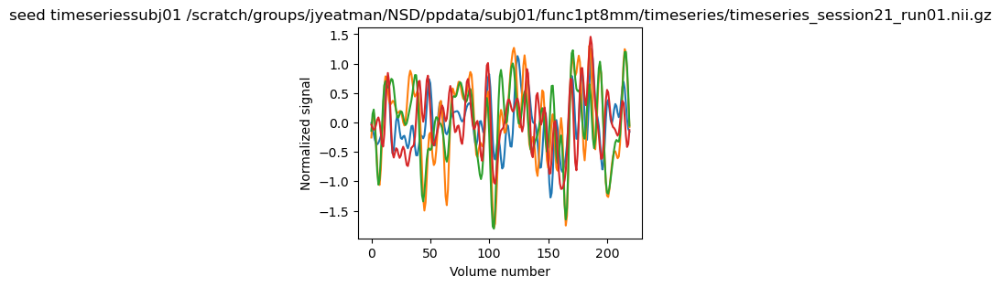

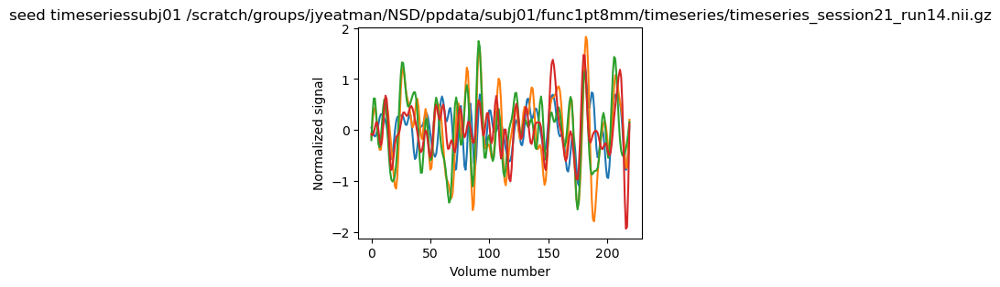

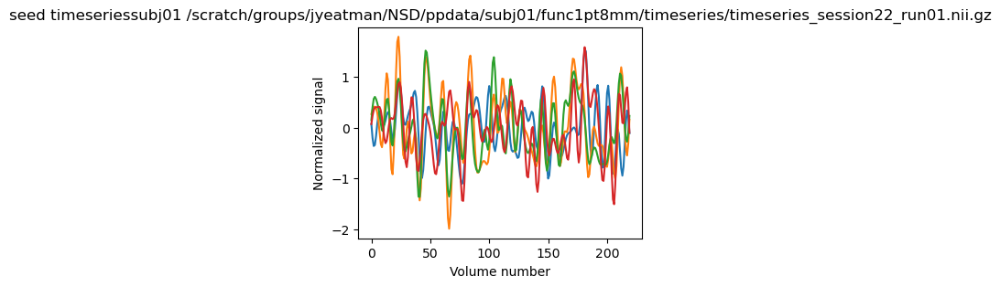

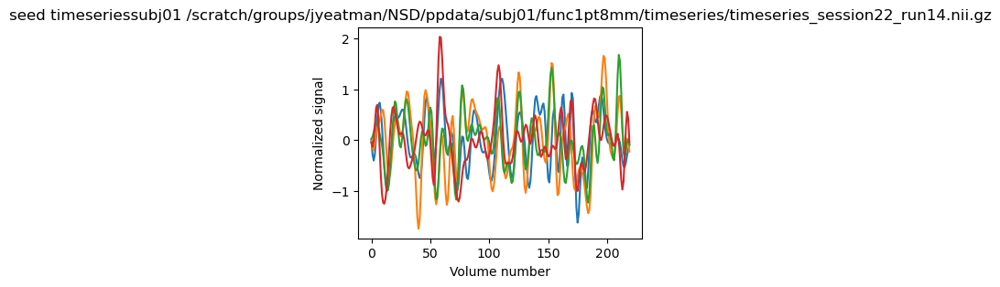

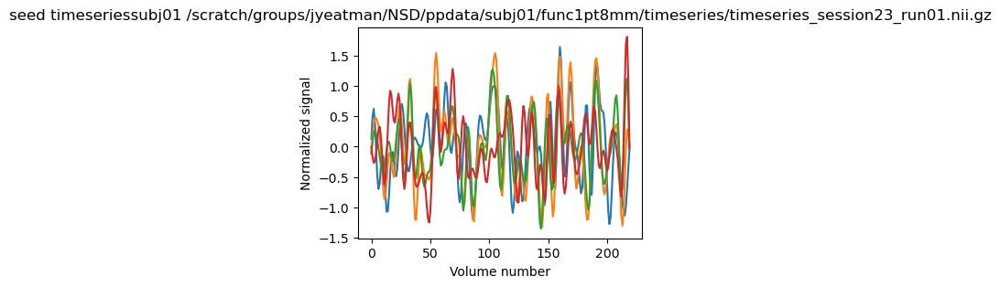

...

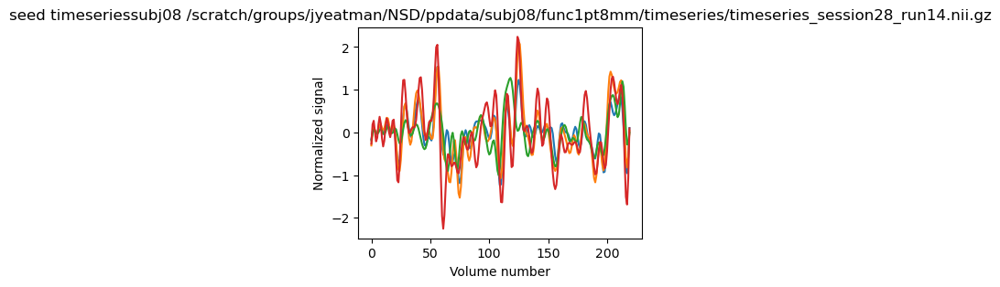

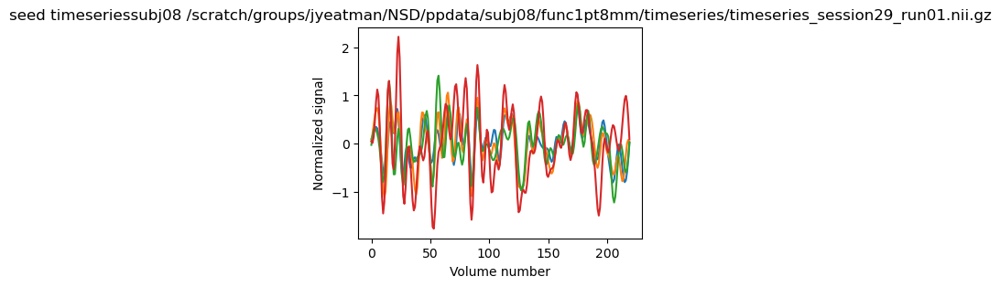

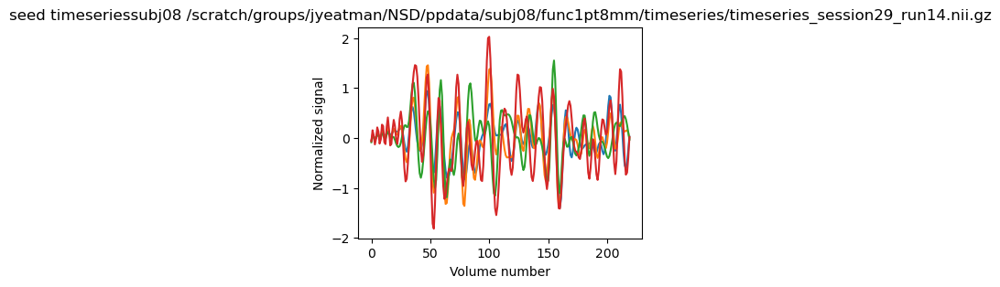

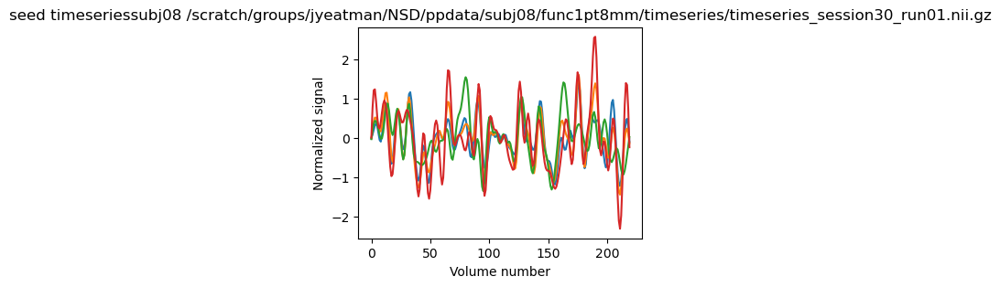

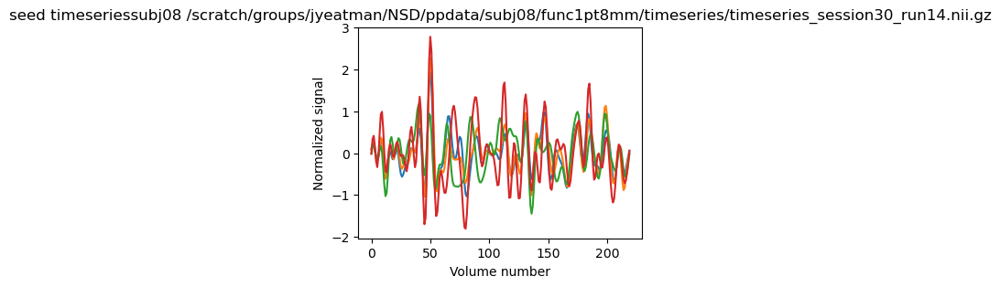

In [5]:
for s,sub in enumerate(subs):
    fssub = fsdir + sub
    bolddir = basedir + sub + '/func1pt8mm/timeseries/'
    motiondir = basedir + sub + '/func1pt8mm/motion/'
    
    lhsurf = surface.load_surf_mesh(fssub + '/surf/'+hemi+'.white')
    labels = surface.load_surf_data(fssub + '/label/'+hemi+'.floc-words.mgz')
    curv = surface.load_surf_data(fssub + '/surf/'+hemi+'.curv')
    
    runs = glob.glob(bolddir + '/timeseries*nii.gz')
    runs.sort()
    print('Found ' + str(len(runs)) + ' runs for sub ' + sub)
    roi_zmap = np.zeros([lhsurf.coordinates.shape[0], len(runs),len(roi_names)])

    # FIXME - This is hard coded, I want to use lhbold.shape[1] but we need to load it first
    rois_timeseries = np.empty((len(runs),220,len(roi_names)))
    rois_timeseries[:] = np.NaN
    for r, run in enumerate(runs):
        boldpath = run
        bold = image.load_img(boldpath)
        bold = image.smooth_img(bold, sk)
        lhbold_path = str.replace(analysisdir + 'vol2surf/' + sub + '_' + os.path.basename(run),'.nii.gz','_'+ hemi+'.gii')
        # vol2surf takes a while, so if we already saved the surface we can load it instead
        if os.path.exists(lhbold_path) and not overwrite:
            print(lhbold_path + ' exists, loading...')
            lhbold = surface.load_surf_data(lhbold_path)
        else:
            print('Converting volume to surface for run: ' + lhbold_path)
            # syntax for vol2surf using nilearn
            # lhbold = surface.vol_to_surf(img=bold,surf_mesh=lhsurf, radius = 3)
            # use nsd precomputed mapping for vol2surf
            # outputfile = os.path.join(analysisdir, 'sub01_' + targetspace + '_' + str.replace(os.path.basename(runs[0]),'.nii.gz','.mgz'))
            
            sourcedata = run
            subjix = int(sub[-1])
            lhbold = nsd.fit(
                subjix,
                sourcespace,
                targetspace,
                sourcedata,
                interptype='cubic',
                badval=0,
                outputfile=None,
                outputclass=None,
                fsdir=os.path.join(fsdir, sub))

            print('Saving as gii')
           # nib.freesurfer.io.write_morph_data(datadir + 'TEST.gii',run_data)
            img = nib.gifti.GiftiImage(darrays=[nib.gifti.GiftiDataArray(lhbold)])
            nib.save(img, lhbold_path)
        
        # load motion regressors
        motion_file = str.replace(run,'timeseries','motion')
        motion_file = str.replace(motion_file,'.nii.gz','.tsv')
        print(motion_file)
        if os.path.exists(motion_file):
            print('Loading motion regressors: '+ motion_file)
            motion=pd.read_csv(motion_file,sep='\t',header=None)
        else:
            print('Cant locate: ' + motion_file)
            continue
        print('Vertices by Timepoints: ')
        print(lhbold.shape)
        if lhbold.shape[0] < lhbold.shape[1]:
            lhbold = np.transpose(lhbold)
        print('Vertices by Timepoints')
        print(lhbold.shape)
        lhbold=np.delete(lhbold,droptp,axis=1)
        motion = motion.drop(droptp)
        
        # load presaved confounds - WM and CSF regressors
        confound_file = str.replace(motion_file,'motion','conf')
        if os.path.exists(confound_file):
            print('Loading confound regressors: '+ confound_file)
            confounds_all = pd.read_csv(confound_file,sep='\t',header=0)
        else:
            print('Cant locate: ' + confound_file)
            continue
        
        # TESTME - select only the desired confounds
        confounds = confounds_all.loc[:,confound_list]
        # combine with scrubbing regressors
        if apply_scrubbing:
            scrubbing_confounds = confounds_all.loc[:, confounds_all.columns.str.startswith('scrub_')]
            confounds=pd.merge(confounds,scrubbing_confounds,left_index=True,right_index=True)

        # drop initial timepoints
        confounds = confounds.iloc[len(droptp): , :]
        
        lhbold = np.transpose(signal.clean(signals = np.transpose(lhbold), filter='butterworth',high_pass=0.008, low_pass = 0.1, 
                                           detrend=True, standardize='zscore',t_r=1.333, confounds =confounds))
#        lhbold_c = np.transpose(signal.clean(signals = np.transpose(lhbold), filter='cosine',high_pass=0.01, detrend=True, standardize='zscore',t_r=1.333, confounds =motion))
        # calculate timeseries for each seed ROI
        
        fig, ax = plt.subplots(figsize =(4, 3))
        for roi in range(len(roi_names)):
            if new_labels:
                cur_roi_path = fssub + '/label/'+roi_names[roi] + '.label'
                if os.path.exists(cur_roi_path):
                    print('Loading ROI: ' + cur_roi_path)
                    cur_roi = surface.load_surf_data(cur_roi_path)
                    cur_roi = cur_roi.astype(int)
                    print('Label size:')
                    print(cur_roi.shape)
                    seed_timeseries = np.nanmean(lhbold[cur_roi],axis=0)
                else:
                    print('Cant locate: ' + cur_roi_path)
                    continue
            else:
                seed_timeseries = np.nanmean(lhbold[labels==roi_labels[roi]],axis=0)
 #              seed_timeseries_c = np.nanmean(lhbold_c[labels==roi_labels[roi]],axis=0)        
        # to plot
            rois_timeseries[r,:,roi] = seed_timeseries
            ax.plot(seed_timeseries)
            ax.set_title('seed timeseries' + sub + ' ' + run)
            ax.set_xlabel('Volume number')
            ax.set_ylabel('Normalized signal')
            print()
  


    #sub_filepath = analysisdir + sub + '_' + roi_names[roi] + '_' + str(len(runs)) + 'runs_' + hemi 
    sub_filepath = outputdir + sub + '_ROI2ROI_' + str(len(runs)) + 'runs_' + hemi 
    np.save(sub_filepath,rois_timeseries)


In [5]:
# # Previous version - without motion derivatives
# qc = pd.read_csv(qc_file,sep='\t',header=0)

# #all_subs = np.zeros((len(subs),20*220,len(roi_names)))
# all_subs = pd.DataFrame(columns=['sub'])
# for s,sub in enumerate(subs):
#     sub_filepath = outputdir + sub + '_ROI2ROI_' + str(20) + 'runs_' + hemi 
#     rois_timeseries = np.load(sub_filepath + '.npy')
#     print('original')
#     print(rois_timeseries.shape)
#     if excludeRuns:
#         filter_runs_idx = qc[(qc['subj']==sub) & (qc['exclude']==True)]['run_id']
#         filter_runs_idx = filter_runs_idx.astype('int')
#         rois_timeseries[filter_runs_idx,:,:]=np.NaN

#     # this code concatenates everything before calculating the correlations, but we decided to calculate correlations
#     # for each run then average across runs
#     new = np.vstack(rois_timeseries)
#     all_subs[s,:,:] = new
#     test = pd.DataFrame(new)
#     test.columns = roi_names
#     fig, ax = plt.subplots(figsize =(4, 3))
#     print(sub)
#     sns.heatmap(test.corr(),cmap='Reds',annot=True)

original
(20, 220, 4)


ValueError: Cannot set a frame with no defined index and a value that cannot be converted to a Series

original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)
original
(20, 220, 4)


Text(0.5, 1.0, 'Average across subjects, N= 8')

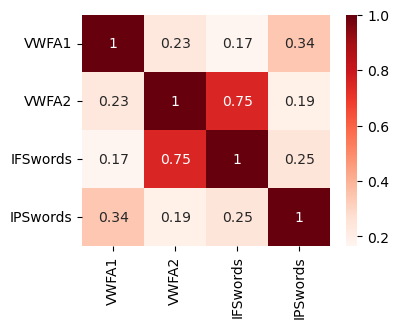

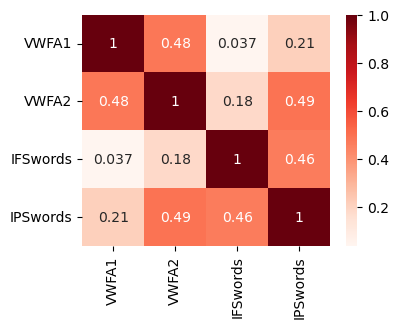

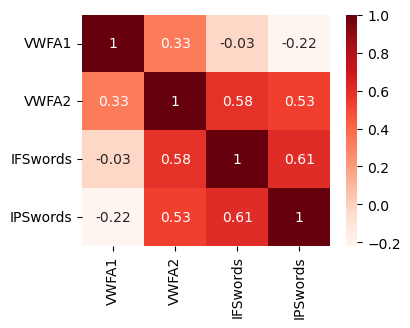

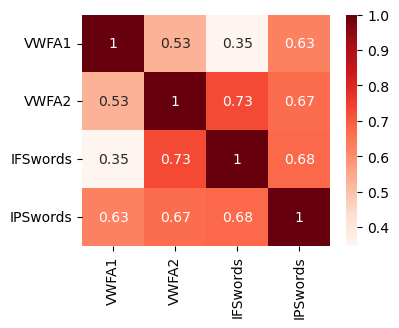

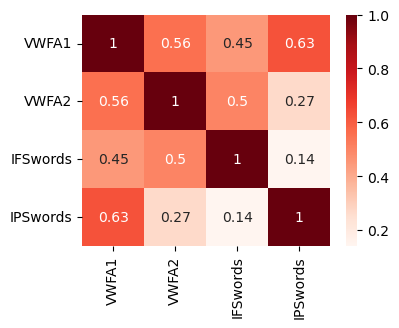

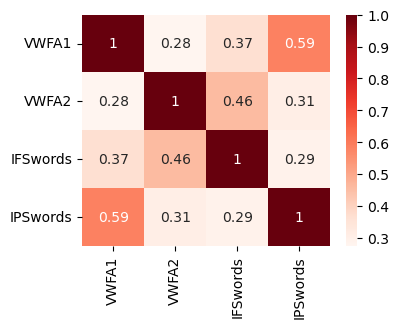

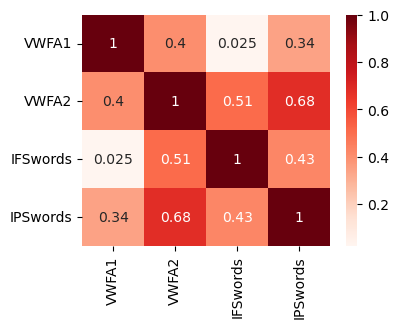

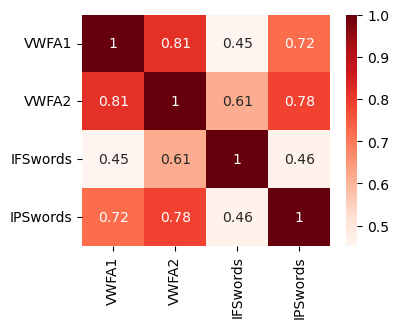

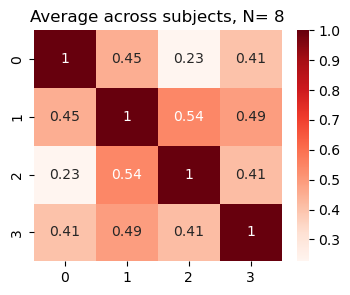

In [5]:
# Code that first calculates correlations within each run, then averages across runs
# then averages across subjects. --> does it make sense to average across subjects? do we need to go to fsaverage?!
qc = pd.read_csv(qc_file,sep='\t',header=0)

#all_subs = np.zeros((len(subs),20*220,len(roi_names)))
all_subs = pd.DataFrame(columns=['sub'])
all_subs_corr = np.empty((len(subs),len(roi_names),len(roi_names)))
all_subs_corr[:] = np.NaN
for s,sub in enumerate(subs):
    sub_filepath = outputdir + sub + '_ROI2ROI_' + str(20) + 'runs_' + hemi 
    rois_timeseries = np.load(sub_filepath + '.npy')
    print('original')
    print(rois_timeseries.shape)
    
    bolddir = basedir + sub + '/func1pt8mm/timeseries/'
    runs = glob.glob(bolddir + '/timeseries*nii.gz')
    runs.sort()
    
    if excludeRuns:
        filter_runs_idx = qc[(qc['subj']==sub) & (qc['exclude']==True)]['run_id']
        filter_runs_idx = filter_runs_idx.astype('int')
        rois_timeseries[filter_runs_idx,:,:]=np.NaN

    sub_corr = np.empty((len(runs),len(roi_names),len(roi_names)))
    sub_corr[:] = np.NaN
    for r in range(len(runs)):
        cur_run = rois_timeseries[r,:,:]
        cur_corr = np.corrcoef(np.transpose(cur_run))
        sub_corr[r,:,:] = cur_corr
        # test for single runs
        plotSingleRuns = False
        if plotSingleRuns==True:
            fig, ax = plt.subplots(figsize =(4, 3))
            sns.heatmap(cur_corr,cmap='Reds',annot=True)

    sub_av_corr = np.nanmean(sub_corr,axis=0)
    all_subs_corr[s,:,:] = sub_av_corr
    sub_av_corr = pd.DataFrame(sub_av_corr)
    sub_av_corr.columns = roi_names
    fig, ax = plt.subplots(figsize =(4, 3))
    sns.heatmap(sub_av_corr,cmap='Reds',annot=True, yticklabels=sub_av_corr.columns)
    
fig, ax = plt.subplots(figsize =(4, 3))
sns.heatmap(np.nanmean(all_subs_corr,axis=0),cmap='Reds',annot=True)
plt.title('Average across subjects, N= ' + str(len(subs)))

In [8]:
# Break it down to a dataframe with columns for correlations
all_subs_df = pd.DataFrame(columns=['sub'])
for s, sub in enumerate(subs):
    for r1 in range(len(roi_names)):
        for r2 in range(len(roi_names)):
        #cur_ind = r + s*len(runs)
            all_subs_df.loc[s,'sub'] = sub
            all_subs_df.loc[s,f"{roi_names[r1]}_{roi_names[r2]}"] = all_subs_corr[s,r1,r2]


In [9]:
all_subs_df

,sub,VWFA1_VWFA1,VWFA1_VWFA2,VWFA1_IFSwords,VWFA1_IPSwords,VWFA2_VWFA1,VWFA2_VWFA2,VWFA2_IFSwords,VWFA2_IPSwords,IFSwords_VWFA1,IFSwords_VWFA2,IFSwords_IFSwords,IFSwords_IPSwords,IPSwords_VWFA1,IPSwords_VWFA2,IPSwords_IFSwords,IPSwords_IPSwords
0,subj01,1.0,0.234080,0.166924,0.340213,0.234080,1.0,0.749633,0.194264,0.166924,0.749633,1.0,0.248202,0.340213,0.194264,0.248202,1.0
1,subj02,1.0,0.479747,0.036961,0.213266,0.479747,1.0,0.180635,0.491404,0.036961,0.180635,1.0,0.462944,0.213266,0.491404,0.462944,1.0
2,subj03,1.0,0.327896,-0.029870,-0.217256,0.327896,1.0,0.583797,0.531927,-0.029870,0.583797,1.0,0.605740,-0.217256,0.531927,0.605740,1.0
3,subj04,1.0,0.528481,0.347431,0.627811,0.528481,1.0,0.730980,0.668006,0.347431,0.730980,1.0,0.675464,0.627811,0.668006,0.675464,1.0
4,subj05,1.0,0.556906,0.448123,0.625795,0.556906,1.0,0.501060,0.266248,0.448123,0.501060,1.0,0.141974,0.625795,0.266248,0.141974,1.0
5,subj06,1.0,0.275316,0.368638,0.586171,0.275316,1.0,0.457818,0.307624,0.368638,0.457818,1.0,0.289524,0.586171,0.307624,0.289524,1.0
6,subj07,1.0,0.404469,0.024613,0.342400,0.404469,1.0,0.511658,0.682518,0.024613,0.511658,1.0,0.425901,0.342400,0.682518,0.425901,1.0
7,subj08,1.0,0.814798,0.452468,0.721823,0.814798,1.0,0.613627,0.784101,0.452468,0.613627,1.0,0.464492,0.721823,0.784101,0.464492,1.0


In [11]:
plot_data = all_subs_df[['sub','VWFA1_IFSwords','VWFA2_IFSwords']]
#plot_data = all_subs_df[['sub','VWFA1_IFSwords','VWFA2_IFSwords','VWFA1_VWFA2']]

In [12]:
plot_data

,sub,VWFA1_IFSwords,VWFA2_IFSwords
0,subj01,0.166924,0.749633
1,subj02,0.036961,0.180635
2,subj03,-0.029870,0.583797
3,subj04,0.347431,0.730980
4,subj05,0.448123,0.501060
5,subj06,0.368638,0.457818
6,subj07,0.024613,0.511658
7,subj08,0.452468,0.613627


In [13]:
plot_data.describe()

,VWFA1_IFSwords,VWFA2_IFSwords
count,8.000000,8.000000
mean,0.226911,0.541151
std,0.200344,0.179668
min,-0.029870,0.180635
25%,0.033874,0.490249
50%,0.257177,0.547728
75%,0.388509,0.642966
max,0.452468,0.749633


In [15]:
plot_data_long = plot_data.melt(id_vars='sub',var_name='IFS_ROI',value_name = 'FC',ignore_index=True)
#plot_data_long=plot_data_long.reset_index()
plot_data_long

,sub,IFS_ROI,FC
0,subj01,VWFA1_IFSwords,0.166924
1,subj02,VWFA1_IFSwords,0.036961
2,subj03,VWFA1_IFSwords,-0.029870
3,subj04,VWFA1_IFSwords,0.347431
4,subj05,VWFA1_IFSwords,0.448123
5,subj06,VWFA1_IFSwords,0.368638
6,subj07,VWFA1_IFSwords,0.024613
7,subj08,VWFA1_IFSwords,0.452468
8,subj01,VWFA2_IFSwords,0.749633
9,subj02,VWFA2_IFSwords,0.180635


(array([0, 1]), [Text(0, 0, 'VWFA1_IFSwords'), Text(1, 0, 'VWFA2_IFSwords')])

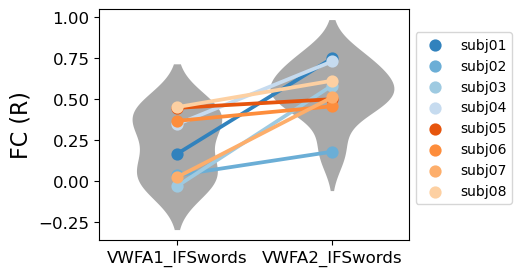

In [16]:
fig, ax = plt.subplots(figsize =(4, 3))
sns.violinplot(data=plot_data_long,x='IFS_ROI',y='FC',color='darkgray',legend=False, linewidth=0)
sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',hue='sub',palette="tab20c",legend=False,markers='o')

plt.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)
plt.ylabel('FC (R)',fontsize=16)
plt.xlabel('')

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
#sns.set_context("poster",font_scale=1.5, rc={"lines.linewidth": 2.5})
#plt.ylabel()
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)

In [17]:
# Try to color by magnitude of difference - regular rois
plot_data['Delta'] =  plot_data.apply(lambda row: row.VWFA2_IFSwords - row.VWFA1_IFSwords, axis = 1)
plot_data_long = plot_data.melt(id_vars=['sub','Delta'],value_vars=['VWFA1_IFSwords','VWFA2_IFSwords'],var_name='IFS_ROI',value_name = 'FC',ignore_index=True)
plot_data_long

/tmp/ipykernel_31083/2933337310.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data['Delta'] =  plot_data.apply(lambda row: row.VWFA2_IFSwords - row.VWFA1_IFSwords, axis = 1)


,sub,Delta,IFS_ROI,FC
0,subj01,0.582709,VWFA1_IFSwords,0.166924
1,subj02,0.143674,VWFA1_IFSwords,0.036961
2,subj03,0.613667,VWFA1_IFSwords,-0.029870
3,subj04,0.383550,VWFA1_IFSwords,0.347431
4,subj05,0.052936,VWFA1_IFSwords,0.448123
5,subj06,0.089180,VWFA1_IFSwords,0.368638
6,subj07,0.487045,VWFA1_IFSwords,0.024613
7,subj08,0.161160,VWFA1_IFSwords,0.452468
8,subj01,0.582709,VWFA2_IFSwords,0.749633
9,subj02,0.143674,VWFA2_IFSwords,0.180635


In [18]:
# edit names so it's easier to plot
plot_data_long.loc[:,'IFS_ROI'][plot_data_long.loc[:,'IFS_ROI']=='VWFA1_IFSwords'] = 'VWFA-1'
plot_data_long.loc[:,'IFS_ROI'][plot_data_long.loc[:,'IFS_ROI']=='VWFA2_IFSwords'] = 'VWFA-2'
plot_data_long

/tmp/ipykernel_31083/4036717499.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data_long.loc[:,'IFS_ROI'][plot_data_long.loc[:,'IFS_ROI']=='VWFA1_IFSwords'] = 'VWFA-1'
/tmp/ipykernel_31083/4036717499.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data_long.loc[:,'IFS_ROI'][plot_data_long.loc[:,'IFS_ROI']=='VWFA2_IFSwords'] = 'VWFA-2'


,sub,Delta,IFS_ROI,FC
0,subj01,0.582709,VWFA-1,0.166924
1,subj02,0.143674,VWFA-1,0.036961
2,subj03,0.613667,VWFA-1,-0.029870
3,subj04,0.383550,VWFA-1,0.347431
4,subj05,0.052936,VWFA-1,0.448123
5,subj06,0.089180,VWFA-1,0.368638
6,subj07,0.487045,VWFA-1,0.024613
7,subj08,0.161160,VWFA-1,0.452468
8,subj01,0.582709,VWFA-2,0.749633
9,subj02,0.143674,VWFA-2,0.180635


(array([0, 1]),
 [Text(0, 0, 'pOTS_lh_IFSwords'), Text(1, 0, 'mOTS_lh_IFSwords')])

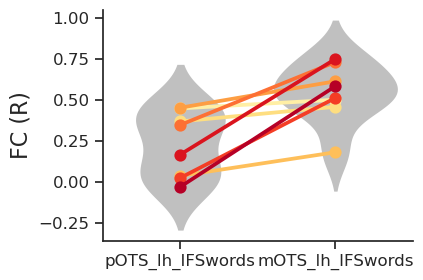

In [23]:

fig, ax = plt.subplots(figsize =(4, 3))
sns.violinplot(data=plot_data_long,x='IFS_ROI',y='FC',color='silver',legend=False, linewidth=0)
sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',hue='Delta',palette="YlOrRd",legend=False,markers='o')

ax.get_legend().remove()
#plt.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)
plt.ylabel('FC (R)',fontsize=16)
plt.xlabel('')

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
#sns.set_context("poster",font_scale=1.5, rc={"lines.linewidth": 2.5})
#plt.ylabel()
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)

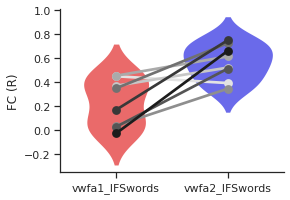

In [104]:
fig, ax = plt.subplots(figsize =(4, 3))

sns.violinplot(data=plot_data_long,x='IFS_ROI',y='FC',palette='seismic_r',legend=False, linewidth=0)
sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',hue='Delta',palette='gist_yarg',legend=False,markers='o')
ax.get_legend().remove()
#plt.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)
plt.ylabel('FC (R)')
plt.xlabel('')

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

Ttest_relResult(statistic=3.8771863745914397, pvalue=0.006075018491323984)


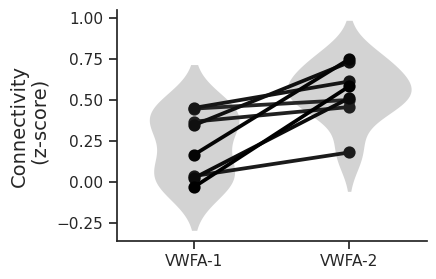

In [22]:
fig, ax = plt.subplots(figsize =(4, 3))

sns.violinplot(data=plot_data_long,x='IFS_ROI',y='FC',color='lightgray',legend=False, linewidth=0)
#sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',hue='Delta',palette='binary',legend=False,markers='o')
sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',hue='Delta',color='black',legend=False,markers='o')
#sns.pointplot(data=plot_data_long,x='IFS_ROI',y='FC',color='gray',legend=False,markers='o')
ax.get_legend().remove()
#plt.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)
plt.ylabel('Connectivity\n (z-score)',fontsize=14,fontname='Helvetica')
plt.xlabel('')

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
res = stats.ttest_rel(plot_data.VWFA2_IFSwords,plot_data.VWFA1_IFSwords)
print(res)

In [28]:
# try to change font
import matplotlib.font_manager
matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')

[]

In [34]:
# package to add asterisk at significant comparisons
import statannot

In [8]:
[a,b] = stats.ttest_rel(plot_data.pOTS_lh_IFSwords,plot_data.mOTS_lh_IFSwords)
print(a)
print(b)

NameError: name 'plot_data' is not defined

In [36]:
plot_data_long

,sub,Delta,IFS_ROI,FC
0,subj01,0.582709,VWFA-1,0.166924
1,subj02,0.309168,VWFA-1,0.034530
2,subj03,0.690407,VWFA-1,-0.029870
3,subj04,0.377615,VWFA-1,0.347431
4,subj05,-0.057119,VWFA-1,0.448123
5,subj06,0.151776,VWFA-1,0.368638
6,subj07,0.487045,VWFA-1,0.024613
7,subj08,0.161160,VWFA-1,0.452468
8,subj01,0.582709,VWFA-2,0.749633
9,subj02,0.309168,VWFA-2,0.343698


(-1.0, 1.0)

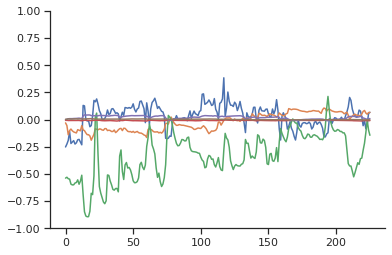

In [30]:
motion_file = '/scratch/groups/jyeatman/NSD/ppdata/subj08/func1pt8mm/motion/motion_session25_run04.tsv'
motion=pd.read_csv(motion_file,sep='\t',header=None)
plt.plot(motion)
plt.ylim([-1,1])

Text(0.5, 0, 'Time (TR)')

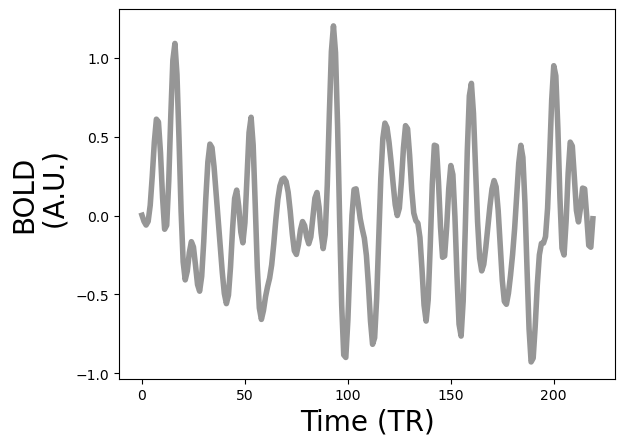

In [23]:
rois_timeseries.shape
#plt.plot(rois_timeseries[0,:,1], color=(210/255, 190/255,255/255), linewidth=4)
plt.plot(rois_timeseries[12,:,0], color=(150/255, 150/255,150/255), linewidth=4)
plt.ylabel('BOLD\n (A.U.)',fontsize=20,fontname='Helvetica')
plt.xlabel('Time (TR)',fontsize=20)

In [9]:
sns.lineplot(rois_timeseries[0,:,1])

AttributeError: module 'seaborn' has no attribute 'plot'

In [ ]:
# interactive viewing and save
rr=0
roi_zmap = np.load(str.replace(sub_filepath,'clean','newlabels')+ '.npy')
view = plotting.view_surf(lhsurf, surf_map=roi_zmap[:,0,rr],
threshold = 0.2, vmax=0.7, colorbar=True,
bg_map=curv,title=sub + '_' + roi_names[rr] + '_' + str(len(runs)) + 'runs')

view

In [ ]:
# interactive viewing and save
rr=0
view = plotting.view_surf(lhsurf, surf_map=np.nanmean(roi_zmap[:,:,rr],axis=1),
threshold = 0.2, vmax=0.7, colorbar=True,
bg_map=curv,title=sub + '_' + roi_names[rr] + '_' + str(len(runs)) + 'runs')

view
#view.save_as_html(sub_filepath + '_' + roi_names[rr] + '.html')

In [ ]:
# Plot t-test
ttest_map = stats.ttest_rel(vwfa1zmap,vwfa2zmap,nan_policy='omit',axis=1)
view = plotting.view_surf(lhsurf, surf_map=ttest_map.statistic,
threshold = 4, vmax=12, colorbar=True,
bg_map=curv,title='t-test')

view
view.save_as_html(analysisdir + 'sub1_vwfa1_vwfa2_'+ str(vwfa1zmap.shape[1])+'runs.html')